In [44]:
# importing data from csv file
# the data is from the link https://data.mendeley.com/datasets/7wpcv7kp6f/1/files/f9030f7a-ca0b-48e3-94dc-664fc2522dd7
import pandas as pd
data = pd.read_csv('./graphs_on_demo/hospitals.csv')
data.head()

,Facility.Name,Facility.City,Facility.State,Facility.Type,Rating.Overall,Rating.Mortality,Rating.Safety,Rating.Readmission,Rating.Experience,Rating.Effectiveness,...,Procedure.Heart Attack.Value,Procedure.Heart Failure.Cost,Procedure.Heart Failure.Quality,Procedure.Heart Failure.Value,Procedure.Pneumonia.Cost,Procedure.Pneumonia.Quality,Procedure.Pneumonia.Value,Procedure.Hip Knee.Cost,Procedure.Hip Knee.Quality,Procedure.Hip Knee.Value
0,Southeast Alabama Medical Center,Dothan,AL,Government,2,Below,Above,Below,Below,Same,...,Average,17041,Average,Average,18281,Average,Average,25812,Average,Higher
1,Marshall Medical Center South,Boaz,AL,Government,1,Below,Below,Below,Same,Above,...,Average,15819,Worse,Average,15614,Worse,Lower,22747,Average,Average
2,Eliza Coffee Memorial Hospital,Florence,AL,Government,3,Below,Above,Above,Below,Same,...,Average,16334,Average,Average,17371,Average,Average,24491,Average,Higher
3,Mizell Memorial Hospital,Opp,AL,Private,1,Same,Same,Below,Below,Below,...,Unknown,14541,Average,Lower,15226,Worse,Lower,23472,Average,Average
4,Crenshaw Community Hospital,Luverne,AL,Proprietary,4,Same,None,Above,None,Same,...,Unknown,13767,Average,Lower,14341,Average,Lower,0,Unknown,Unknown


In [45]:
"""
    This is an attempt to automate the process of finding the number of columns and rows in a dataframe and also the number of numeric values in each column.
"""
#importing libraries
from pandas.api.types import is_string_dtype
from pandas.api.types import is_numeric_dtype

# finding numbers in the dataframe
print("The number of columns in your data is: " + str(len(data.columns)))
print("The number of rows in your data is: " + str(len(data)))

# def find columns with string values (if you find at least one string value, then the column is string type)

col_string_indexes = []
col_numeric_indexes = []

for col in data.columns:
    if is_numeric_dtype(data[col]):
        col_numeric_indexes.append(data.columns.get_loc(col))
    else:
        col_string_indexes.append(data.columns.get_loc(col))
print("The columns with string values are: " + str(col_string_indexes))
print ("The columns with numeric values are: " + str(col_numeric_indexes))

The number of columns in your data is: 24
The number of rows in your data is: 4772
The columns with string values are: [0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 13, 14, 16, 17, 19, 20, 22, 23]
The columns with numeric values are: [4, 12, 15, 18, 21]


In [46]:
# converting strings to interger
from sklearn.preprocessing import LabelBinarizer
import numpy

print ("Copying the data")
data_edited = data.copy()

print ("starting the conversion on the copied data")
for i in range(0, len(data_edited.columns)):
    if i in col_string_indexes:
        print("Converting column: " + str(i))
        array_of_ohe = LabelBinarizer().fit_transform(data_edited.iloc[:,i])
        print("Obtained the array of one hot encoded values")
        print ("The shape of the array is: " + str(array_of_ohe.shape))
        watch_var=[]
        print ("Starting the loop")
        for j in range(0, array_of_ohe.shape[0]):
            watch_var.append(numpy.where(array_of_ohe[j,:] == 1)[0][0])
        data_edited[data_edited.columns[i]] = watch_var
data_edited.head()

Copying the data
starting the conversion on the copied data
Converting column: 0
Obtained the array of one hot encoded values
The shape of the array is: (4772, 4589)
Starting the loop
Converting column: 1
Obtained the array of one hot encoded values
The shape of the array is: (4772, 2929)
Starting the loop
Converting column: 2
Obtained the array of one hot encoded values
The shape of the array is: (4772, 56)
Starting the loop
Converting column: 3
Obtained the array of one hot encoded values
The shape of the array is: (4772, 5)
Starting the loop
Converting column: 5
Obtained the array of one hot encoded values
The shape of the array is: (4772, 4)
Starting the loop
Converting column: 6
Obtained the array of one hot encoded values
The shape of the array is: (4772, 4)
Starting the loop
Converting column: 7
Obtained the array of one hot encoded values
The shape of the array is: (4772, 4)
Starting the loop
Converting column: 8
Obtained the array of one hot encoded values
The shape of the arr

,Facility.Name,Facility.City,Facility.State,Facility.Type,Rating.Overall,Rating.Mortality,Rating.Safety,Rating.Readmission,Rating.Experience,Rating.Effectiveness,...,Procedure.Heart Attack.Value,Procedure.Heart Failure.Cost,Procedure.Heart Failure.Quality,Procedure.Heart Failure.Value,Procedure.Pneumonia.Cost,Procedure.Pneumonia.Quality,Procedure.Pneumonia.Value,Procedure.Hip Knee.Cost,Procedure.Hip Knee.Quality,Procedure.Hip Knee.Value
0,3659,694,1,1,2,1,0,1,1,3,...,0,17041,0,0,18281,0,0,25812,0,1
1,2214,262,1,1,1,1,1,1,3,0,...,0,15819,3,0,15614,3,2,22747,0,0
2,1113,870,1,1,3,1,0,0,1,3,...,0,16334,0,0,17371,0,0,24491,0,1
3,2573,1917,1,2,1,3,3,1,1,1,...,3,14541,0,2,15226,3,2,23472,0,0
4,934,1515,1,3,4,3,2,0,2,3,...,3,13767,0,2,14341,0,2,0,2,3


In [47]:
from sklearn import preprocessing
# normalizing each column in data_edited
x = data_edited.iloc[:,1:].values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
data_normalized = pd.DataFrame(x_scaled)
data_normalized.head()

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,0.237022,0.018182,0.25,0.500000,0.333333,0.000000,0.333333,0.333333,1.000000,0.0,...,0.0,0.759065,0.0,0.000000,0.673929,0.0,0.000000,0.606685,0.000000,0.333333
1,0.089481,0.018182,0.25,0.333333,0.333333,0.333333,0.333333,1.000000,0.000000,0.0,...,0.0,0.704633,1.0,0.000000,0.575610,1.0,0.666667,0.534645,0.000000,0.000000
2,0.297131,0.018182,0.25,0.666667,0.333333,0.000000,0.000000,0.333333,1.000000,0.0,...,0.0,0.727572,0.0,0.000000,0.640382,0.0,0.000000,0.575636,0.000000,0.333333
3,0.654713,0.018182,0.50,0.333333,1.000000,1.000000,0.333333,0.333333,0.333333,0.0,...,1.0,0.647706,0.0,0.666667,0.561306,1.0,0.666667,0.551685,0.000000,0.000000
4,0.517418,0.018182,0.75,0.833333,1.000000,0.666667,0.000000,0.666667,1.000000,0.0,...,1.0,0.613229,0.0,0.666667,0.528681,0.0,0.666667,0.000000,0.666667,1.000000


In [48]:
# PCA
from sklearn.decomposition import PCA
import numpy as np

data_norm_numpy = data_normalized.to_numpy()
pca = PCA(n_components=len(data_norm_numpy[0,:]))
output_pca = pca.fit(data_norm_numpy)
output_pca_transformed = pca.fit_transform(data_norm_numpy)

print ("The explained variance ratio is: " + str(output_pca.explained_variance_ratio_))
# print ("The singular values are: " + str(output_pca.singular_values_))
# print ("The components are: " + str(output_pca.components_))
# print ("The mean is: " + str(output_pca.mean_))
# print ("The number of components is: " + str(output_pca.n_components_))
# number of components
n_pcs= pca.components_.shape[0]

# get the index of the most important feature on EACH component
# LIST COMPREHENSION HERE
most_important = [np.abs(pca.components_[i]).argmax() for i in range(n_pcs)]

initial_feature_names = data_edited.columns
# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]

# LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

print ("The dictionary is: " + str(dic))

The explained variance ratio is: [0.36099042 0.11265113 0.06571597 0.05599029 0.05039128 0.04281375
 0.04040165 0.03614079 0.03152322 0.03026301 0.02930564 0.02696072
 0.02485716 0.02395045 0.01845705 0.0147855  0.01032553 0.00945035
 0.00528101 0.00404784 0.00287693 0.00158649 0.00123384]
The dictionary is: {'PC0': 'Procedure.Heart Attack.Quality', 'PC1': 'Procedure.Heart Failure.Quality', 'PC2': 'Procedure.Hip Knee.Quality', 'PC3': 'Rating.Effectiveness', 'PC4': 'Rating.Readmission', 'PC5': 'Procedure.Pneumonia.Quality', 'PC6': 'Rating.Safety', 'PC7': 'Rating.Timeliness', 'PC8': 'Facility.Name', 'PC9': 'Facility.Name', 'PC10': 'Facility.City', 'PC11': 'Rating.Mortality', 'PC12': 'Facility.State', 'PC13': 'Rating.Experience', 'PC14': 'Procedure.Pneumonia.Cost', 'PC15': 'Facility.Type', 'PC16': 'Procedure.Heart Failure.Cost', 'PC17': 'Procedure.Hip Knee.Cost', 'PC18': 'Procedure.Heart Failure.Value', 'PC19': 'Procedure.Heart Attack.Quality', 'PC20': 'Procedure.Heart Attack.Value', 'PC2

The shape of the output_pca_transformed is: (4772, 23)
[ 2 23]
The shape of xs is: (4772,)
The shape of ys is: (4772,)
The number of components is: 23
Unique colors are: 169


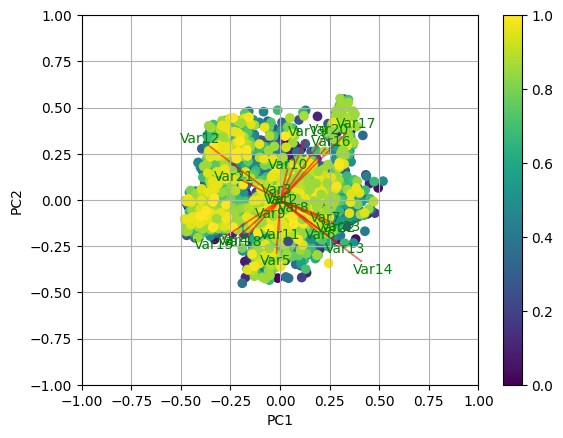

In [49]:
#watching details of the PCA
import matplotlib.pyplot as plt

# creating array of colors
colors_array_int = data_edited.iloc[:,2].to_numpy()
colors_array_float = colors_array_int.astype(float)/colors_array_int.max()
colors_array_seq = [plt.cm.viridis(elem) for elem in colors_array_float]

def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    print ("The shape of xs is: " + str(xs.shape))
    print ("The shape of ys is: " + str(ys.shape))
    n = coeff.shape[0]
    print("The number of components is: " + str(n))
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    print ("Unique colors are: " + str(len(np.unique(colors_array_seq))))
    plt.scatter(xs * scalex, ys * scaley, c = colors_array_seq)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
plt.xlim(-1,1)
plt.ylim(-1,1)
plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
plt.grid()

#Call the function. Use only the 2 PCs.
print ("The shape of the output_pca_transformed is: " + str(output_pca_transformed.shape))
print (np.transpose(pca.components_[0:2, :].shape))
myplot(output_pca_transformed[:,1:3],np.transpose(pca.components_[0:2, :]))
plt.colorbar()
plt.show()

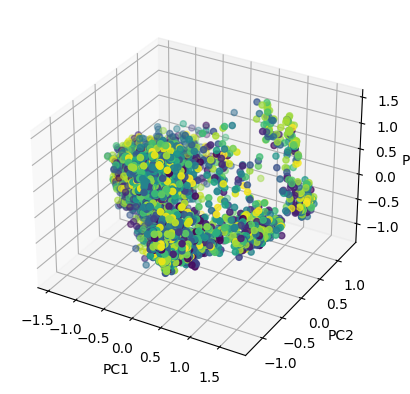

In [50]:
ax = plt.axes(projection='3d')
ax.scatter(output_pca_transformed[:,0], output_pca_transformed[:,1], output_pca_transformed[:,2], c = colors_array_seq)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

plt.show()

In [51]:
#building the simplicial complex
import gudhi as gd
import networkx as nx

def building_gudhi_txt(file_name, rips_simplex_tree, debug = False):
    """This is the file that builds the txt file that contains the Gudhi simplicial complex.
        the header is:
        node1_id,x1,y1,z1,node2_id,x2,y2,z2,weight,
    """
    
    if debug: print ("type of Rips_simplex_tree_sample is: " + str(type(rips_simplex_tree)))
    if debug: print ("The number of simplices is: " + str(rips_simplex_tree.num_simplices()))
    if debug: print ("The num of vertices is: " + str(rips_simplex_tree.num_vertices()))
    if debug: print ("The dimension is: " + str(rips_simplex_tree.dimension()))
    fmt_new = '%d,%f,%f,%f,%d,%f,%f,%f,%f,'
    fmt = '%s -> %.4f'
    file = open(file_name, "w")
    file_new = open("new_" + file_name, "w")
    file.write("node1_id,x1,y1,z1,node2_id,x2,y2,z2,weight,\n")
    edge_index_list = []
    nodes_ids_and_coordinates = []
    
    for filtered_value in rips_simplex_tree.get_filtration():
        
        if len(filtered_value[0]) == 2:
            node_1 = filtered_value[0][0]
            node_2 = filtered_value[0][1]
            weight = filtered_value[1]
            if debug: 
                print ("Nodes connected are: " + str(node_1) + ";" + str(node_2))
                print ("Nodes coordinates are:" + str(output_pca_transformed[node_1,0]) + ";" + str(output_pca_transformed[node_1,1]) + ";" + str(output_pca_transformed[node_1,2]) + ";" + str(output_pca_transformed[node_2,0]) + ";" + str(output_pca_transformed[node_2,1]) + ";" + str(output_pca_transformed[node_2,2]))
            edge_index_list.append([node_1, node_2, weight])
            nodes_ids_and_coordinates.append([node_1 , output_pca_transformed[node_1,0], output_pca_transformed[node_1,1], output_pca_transformed[node_1,2]])
            nodes_ids_and_coordinates.append([node_2 , output_pca_transformed[node_2,0], output_pca_transformed[node_2,1], output_pca_transformed[node_2,2]])

        tuple_filtered_value = tuple(filtered_value)
        #print (tuple_filtered_value)
        print(fmt % tuple(filtered_value))
        file.write(fmt % tuple(filtered_value))
        file.write("\n")
    file.close()
    nodes_ids_and_coordinates = np.unique(nodes_ids_and_coordinates, axis = 0)
    return edge_index_list, nodes_ids_and_coordinates
points_selected = 600 #number of points to be selected

skeleton = gd.RipsComplex(points = output_pca_transformed[1:points_selected,0:2], max_edge_length = 0.1)
print (type(output_pca_transformed))
Rips_simplex_tree_sample = skeleton.create_simplex_tree(max_dimension = 3)
file_name = "output.txt"
edge_index_list, nodes_ids_and_coordinates = building_gudhi_txt(file_name, Rips_simplex_tree_sample, True)

<class 'numpy.ndarray'>
type of Rips_simplex_tree_sample is: <class 'gudhi.simplex_tree.SimplexTree'>
The number of simplices is: 437243
The num of vertices is: 599
The dimension is: 3
[0] -> 0.0000
[1] -> 0.0000
[2] -> 0.0000
[3] -> 0.0000
[4] -> 0.0000
[5] -> 0.0000
[6] -> 0.0000
[7] -> 0.0000
[8] -> 0.0000
[9] -> 0.0000
[10] -> 0.0000
[11] -> 0.0000
[12] -> 0.0000
[13] -> 0.0000
[14] -> 0.0000
[15] -> 0.0000
[16] -> 0.0000
[17] -> 0.0000
[18] -> 0.0000
[19] -> 0.0000
[20] -> 0.0000
[21] -> 0.0000
[22] -> 0.0000
[23] -> 0.0000
[24] -> 0.0000
[25] -> 0.0000
[26] -> 0.0000
[27] -> 0.0000
[28] -> 0.0000
[29] -> 0.0000
[30] -> 0.0000
[31] -> 0.0000
[32] -> 0.0000
[33] -> 0.0000
[34] -> 0.0000
[35] -> 0.0000
[36] -> 0.0000
[37] -> 0.0000
[38] -> 0.0000
[39] -> 0.0000
[40] -> 0.0000
[41] -> 0.0000
[42] -> 0.0000
[43] -> 0.0000
[44] -> 0.0000
[45] -> 0.0000
[46] -> 0.0000
[47] -> 0.0000
[48] -> 0.0000
[49] -> 0.0000
[50] -> 0.0000
[51] -> 0.0000
[52] -> 0.0000
[53] -> 0.0000
[54] -> 0.0000


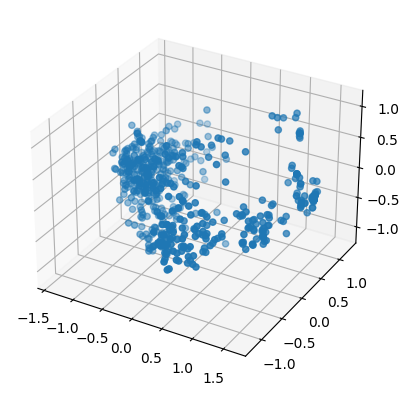

<AxesSubplot: title={'center': 'Persistence barcode'}>

<Figure size 640x480 with 0 Axes>

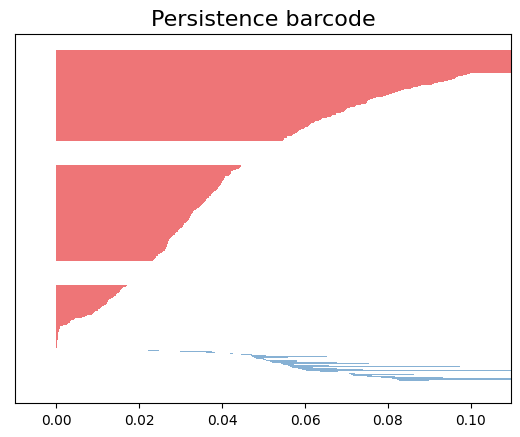

In [52]:
ax = plt.axes(projection='3d')
points_selected = 600 #number of points to be selected

ax.scatter(output_pca_transformed[:points_selected,0], output_pca_transformed[:points_selected,1], output_pca_transformed[:points_selected,2])
plt.show()
plt.figure()
gd.plot_persistence_barcode(Rips_simplex_tree_sample.persistence())

In [53]:
import plotly.graph_objects as go
import plotly.express as px
points_selected = 600 #number of points to be selected
x, y, z = output_pca_transformed[:points_selected,0], output_pca_transformed[:points_selected,1], output_pca_transformed[:points_selected,2]

#fig = go.Figure(data=[go.Mesh3d(x=x, y=y, z=z, color='lightpink', opacity=0.50)])

fig = go.Figure(data=[go.Mesh3d(x=x, y=y, z=z, alphahull=5, opacity=0.4, color='cyan')])
df = pd.DataFrame(data=output_pca_transformed[:points_selected,0:2])
fig.show()
#fig = px.scatter_3d(pd.DataFrame(data=output_pca_transformed[:,0:2]))
fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z,mode='markers')])
fig.show()


# building the graph for pytorch geometric


In [54]:
"""In this part I am trying to create the data for pytorch_geometric starting from the edge_index_list and the nodes_ids_and_coordinates
the building of the graph starts from the simplex obtained
"""

# creating the data for pytorch_geometric
import torch
from torch_geometric.data import Data
import numpy as np

edge_index_1 = torch.tensor(edge_index_list, dtype = torch.long).t().contiguous()
edge_index_1 = edge_index_1[0:2,:]

#creating a temporary array in order to create the edge_index_2
tmp = np.array(edge_index_list)
edge_index_2 = torch.tensor([tmp[:,1],tmp[:,0]], dtype = torch.long)
edge_concat = torch.concatenate((edge_index_1, edge_index_2),1)
edge_concat_edited = edge_concat[0]

array_tmp1 = []
array_tmp2 = []
for ec in edge_concat[0,:]:
    for nd in nodes_ids_and_coordinates[:,0]:
        if ec == nd:
            array_tmp1.append(np.where(nodes_ids_and_coordinates[:,0]==nd)[0][0])

for ec in edge_concat[1,:]:
    for nd in nodes_ids_and_coordinates[:,0]:
        if ec == nd:
            array_tmp2.append(np.where(nodes_ids_and_coordinates[:,0]==nd)[0][0])

edge_concat_edited = torch.tensor([array_tmp1, array_tmp2], dtype = torch.long)
node_features = torch.tensor(nodes_ids_and_coordinates[:,1:4], dtype = torch.float)
print (edge_concat_edited)
#creating the data desired
data_created = Data(x = node_features, edge_index = edge_concat_edited)

/var/folders/jf/x2y6wx3j4qq61fpf0trn86ch0000gn/T/ipykernel_25979/3962136289.py:10: DeprecationWarning:

an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.

/var/folders/jf/x2y6wx3j4qq61fpf0trn86ch0000gn/T/ipykernel_25979/3962136289.py:15: DeprecationWarning:

an integer is required (got type numpy.float64).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.



tensor([[574, 132, 132,  ..., 295, 259, 378],
        [576, 169, 168,  ..., 206, 126, 140]])


tensor([[574, 132, 132,  ..., 295, 259, 378],
        [576, 169, 168,  ..., 206, 126, 140]])
tensor([[574, 132, 132,  ..., 295, 259, 378],
        [576, 169, 168,  ..., 206, 126, 140]])


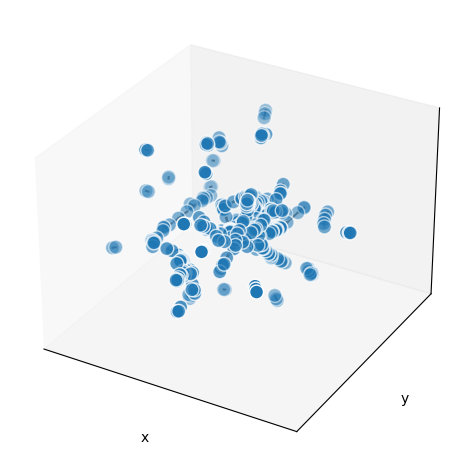

In [55]:
from torch_geometric.utils import train_test_split_edges
#from torch_geometric.transforms import RandomLinkSplit
from torch_geometric.utils import convert
#from torch_geometric.deprecation import deprecated
from torch_geometric.utils import to_undirected
import math

import torch

import torch_geometric
import networkx as nx


# redifing the function train_test_split_edges in order to have the possibility to have the same split for different graphs
def train_test_split_edges(
    data: 'torch_geometric.data.Data',
    val_ratio: float = 0.05,
    test_ratio: float = 0.1,
) -> 'torch_geometric.data.Data':
    r"""Splits the edges of a :class:`torch_geometric.data.Data` object
    into positive and negative train/val/test edges.
    As such, it will replace the :obj:`edge_index` attribute with
    :obj:`train_pos_edge_index`, :obj:`train_pos_neg_adj_mask`,
    :obj:`val_pos_edge_index`, :obj:`val_neg_edge_index` and
    :obj:`test_pos_edge_index` attributes.
    If :obj:`data` has edge features named :obj:`edge_attr`, then
    :obj:`train_pos_edge_attr`, :obj:`val_pos_edge_attr` and
    :obj:`test_pos_edge_attr` will be added as well.

    .. warning::

        :meth:`~torch_geometric.utils.train_test_split_edges` is deprecated and
        will be removed in a future release.
        Use :class:`torch_geometric.transforms.RandomLinkSplit` instead.

    Args:
        data (Data): The data object.
        val_ratio (float, optional): The ratio of positive validation edges.
            (default: :obj:`0.05`)
        test_ratio (float, optional): The ratio of positive test edges.
            (default: :obj:`0.1`)

    :rtype: :class:`torch_geometric.data.Data`
    """

    assert 'batch' not in data  # No batch-mode.

    num_nodes = data.num_nodes
    row, col = data.edge_index
    edge_attr = data.edge_attr
    #data.edge_index = data.edge_attr = None

    # Return upper triangular portion.
    mask = row < col
    row, col = row[mask], col[mask]

    if edge_attr is not None:
        edge_attr = edge_attr[mask]

    n_v = int(math.floor(val_ratio * row.size(0)))
    n_t = int(math.floor(test_ratio * row.size(0)))

    # Positive edges.
    perm = torch.randperm(row.size(0))
    row, col = row[perm], col[perm]
    if edge_attr is not None:
        edge_attr = edge_attr[perm]

    r, c = row[:n_v], col[:n_v]
    data.val_pos_edge_index = torch.stack([r, c], dim=0)
    if edge_attr is not None:
        data.val_pos_edge_attr = edge_attr[:n_v]

    r, c = row[n_v:n_v + n_t], col[n_v:n_v + n_t]
    data.test_pos_edge_index = torch.stack([r, c], dim=0)
    if edge_attr is not None:
        data.test_pos_edge_attr = edge_attr[n_v:n_v + n_t]

    r, c = row[n_v + n_t:], col[n_v + n_t:]
    data.train_pos_edge_index = torch.stack([r, c], dim=0)
    if edge_attr is not None:
        out = to_undirected(data.train_pos_edge_index, edge_attr[n_v + n_t:])
        data.train_pos_edge_index, data.train_pos_edge_attr = out
    else:
        data.train_pos_edge_index = to_undirected(data.train_pos_edge_index)

    # Negative edges.
    neg_adj_mask = torch.ones(num_nodes, num_nodes, dtype=torch.uint8)
    neg_adj_mask = neg_adj_mask.triu(diagonal=1).to(torch.bool)
    neg_adj_mask[row, col] = 0

    neg_row, neg_col = neg_adj_mask.nonzero(as_tuple=False).t()
    perm = torch.randperm(neg_row.size(0))[:n_v + n_t]
    neg_row, neg_col = neg_row[perm], neg_col[perm]

    neg_adj_mask[neg_row, neg_col] = 0
    data.train_neg_adj_mask = neg_adj_mask

    row, col = neg_row[:n_v], neg_col[:n_v]
    data.val_neg_edge_index = torch.stack([row, col], dim=0)

    row, col = neg_row[n_v:n_v + n_t], neg_col[n_v:n_v + n_t]
    data.test_neg_edge_index = torch.stack([row, col], dim=0)

    return data
data_created = Data(x = node_features, edge_index = edge_concat_edited)
print (data_created.edge_index)
#data = data_created
data = train_test_split_edges(data_created)
print (data.edge_index)
#nuovo
# transform = RandomLinkSplit(is_undirected=True)
# train_data, val_data, test_data = transform(data_created)
# data = train_data
# nuovo

G = convert.to_networkx(data, to_undirected=True)

# 3d spring layout
pos = nx.spring_layout(G, dim=3, seed=779)
# Extract node and edge positions from the layout
node_xyz = np.array([pos[v] for v in sorted(G)])
edge_xyz = np.array([(pos[u], pos[v]) for u, v in G.edges()])

# Create the 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

# Plot the nodes - alpha is scaled by "depth" automatically
ax.scatter(*node_xyz.T, s=100, ec="w")

# Plot the edges
for vizedge in edge_xyz:
    ax.plot(*vizedge.T, color="tab:gray")


def _format_axes(ax):
    """Visualization options for the 3D axes."""
    # Turn gridlines off
    ax.grid(False)
    # Suppress tick labels
    for dim in (ax.xaxis, ax.yaxis, ax.zaxis):
        dim.set_ticks([])
    # Set axes labels
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")


_format_axes(ax)
fig.tight_layout()
plt.show()


In [56]:
from torch_geometric.nn import GCNConv

class GCNEncoder(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(GCNEncoder, self).__init__()
        self.conv1 = GCNConv(in_channels, 2 * out_channels, cached=True) # cached only for transductive learning
        self.conv2 = GCNConv(2 * out_channels, out_channels, cached=True) # cached only for transductive learning

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index).relu()
        return self.conv2(x, edge_index)

In [57]:
from torch_geometric.nn import GAE

# parameters
out_channels = 2
num_features = data.num_features
epochs = 500

# model
model = GAE(GCNEncoder(num_features, out_channels))

# move to GPU (if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
x = data.x.to(device)
train_pos_edge_index = data.train_pos_edge_index.to(device)

# inizialize the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

In [58]:
def train():
    model.train()
    optimizer.zero_grad()
    z = model.encode(x, train_pos_edge_index)
    loss = model.recon_loss(z, train_pos_edge_index)
    loss.backward()
    optimizer.step()
    return float(loss)


def test(pos_edge_index, neg_edge_index):
    model.eval()
    with torch.no_grad():
        z = model.encode(x, train_pos_edge_index)
    return model.test(z, pos_edge_index, neg_edge_index)



In [59]:
for epoch in range(1, epochs + 1):
    loss = train()

    auc, ap = test(data.test_pos_edge_index, data.test_neg_edge_index)
    print('Epoch: {:03d}, AUC: {:.4f}, AP: {:.4f}'.format(epoch, auc, ap))

Epoch: 001, AUC: 0.8281, AP: 0.8302
Epoch: 002, AUC: 0.8307, AP: 0.8316
Epoch: 003, AUC: 0.8323, AP: 0.8325
Epoch: 004, AUC: 0.8335, AP: 0.8333
Epoch: 005, AUC: 0.8343, AP: 0.8337
Epoch: 006, AUC: 0.8347, AP: 0.8339
Epoch: 007, AUC: 0.8351, AP: 0.8342
Epoch: 008, AUC: 0.8353, AP: 0.8343
Epoch: 009, AUC: 0.8359, AP: 0.8347
Epoch: 010, AUC: 0.8362, AP: 0.8349
Epoch: 011, AUC: 0.8365, AP: 0.8351
Epoch: 012, AUC: 0.8368, AP: 0.8353
Epoch: 013, AUC: 0.8369, AP: 0.8354
Epoch: 014, AUC: 0.8370, AP: 0.8355
Epoch: 015, AUC: 0.8370, AP: 0.8343
Epoch: 016, AUC: 0.8370, AP: 0.8342
Epoch: 017, AUC: 0.8371, AP: 0.8343
Epoch: 018, AUC: 0.8372, AP: 0.8345
Epoch: 019, AUC: 0.8375, AP: 0.8352
Epoch: 020, AUC: 0.8378, AP: 0.8354
Epoch: 021, AUC: 0.8381, AP: 0.8361
Epoch: 022, AUC: 0.8384, AP: 0.8371
Epoch: 023, AUC: 0.8388, AP: 0.8383
Epoch: 024, AUC: 0.8391, AP: 0.8397
Epoch: 025, AUC: 0.8393, AP: 0.8403
Epoch: 026, AUC: 0.8395, AP: 0.8398
Epoch: 027, AUC: 0.8397, AP: 0.8380
Epoch: 028, AUC: 0.8402, AP:

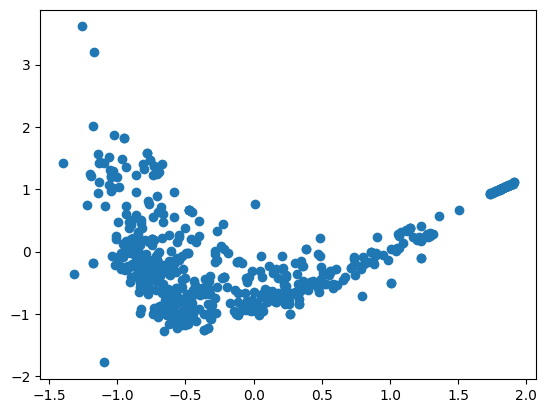

In [60]:
import matplotlib.pyplot as plt
Z = model.encode(x, train_pos_edge_index)
Z
plt.plot (Z.detach().numpy()[:,0], Z.detach().numpy()[:,1], 'o')